In [29]:
import transformers
from transformers import AutoTokenizer, AutoModel, PreTrainedTokenizerFast, AdamW, get_linear_schedule_with_warmup, BertForSequenceClassification
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from captum.attr import visualization as viz
from captum.attr import LayerConductance, LayerIntegratedGradients
from typing import List
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import logging
import os
from functools import lru_cache
from tokenizers import ByteLevelBPETokenizer
from tokenizers.processors import BertProcessing
from torch.utils.data import DataLoader, Dataset
from argparse import Namespace
from sklearn.metrics import classification_report, multilabel_confusion_matrix
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
import torchmetrics
from torchmetrics import F1Score as f1
from torchmetrics.functional import accuracy, auroc
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from pylab import rcParams
from matplotlib import rc


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [30]:
def kmer_split(sequence,kmer_len):
  seq, i, kmer = [], 0 , []
  for i in range (0,len(sequence),kmer_len):
    seq.append(sequence[i:i+kmer_len])
    i+=kmer_len
  kmer= " ".join(seq)
  return kmer

In [31]:
import pandas as pd
df = pd.read_csv('220831_UTEX2973_WT_50up_filtered.csv', header=0)
df['promoter']=1
df['non_promoter']=0
df

,sequence,read_tss,read_count,change_factor,ribosomal,promoter,non_promoter
0,GATCGCCCGATCTACTTCTTCTGAGTGGCGACTTGAGCGAGGATGG...,227,25.0,3.571429,no,1,0
1,TTGCTCACCATCAGCAAGTCCGCCTTGTGCTTTCGGGGCATGCTCA...,629,23.0,7.666667,no,1,0
2,ACGGGACGAGTGCGGGGTGCAGACTCTGTCACTGATTTAGCGTTGG...,1477,389.0,2.924812,no,1,0
3,ACCGCGATCCCAACTCCACCGTGCGCTTACCAGAAGTGCAAGGTGT...,1955,121.0,2.372549,no,1,0
4,GATTCAGTCGCCTTTTTTAGTTGCGACAGGCAGGCTCGTATACTGA...,2259,510.0,127.500000,no,1,0
...,...,...,...,...,...,...,...
15442,TAGGCTAAGAGCGAGAATCGATCGCTGGAAATCACGTCCTAAACTT...,2605696,1136.0,19.929825,no,1,0
15443,CCGCGATCGCTGCAACGCAGAAGCCTGAAAGGTGAGCCGGTATGAT...,2628187,144.0,28.800000,no,1,0
15444,GCGCCCAACAATAAGCCCCCGTAGACCCGAACAATCCTCTAATATG...,2644806,26288.0,417.269841,no,1,0
15445,TGATCGCGACCGACGCTGCAGGTTTCGCAAATCCCCTTGCAGAATG...,2660771,5070.0,72.428571,no,1,0


In [32]:
import numpy as np
seq_list=[]
for i in df.sequence: 
  seq_list.append(kmer_split(i,5))
df['seq2']=pd.Series(seq_list)

In [33]:
quantile=df['read_count'].quantile(q=0.3)
df=df[df['read_count'] > round(quantile)]
df=df[df['change_factor'] > 5]
df= df.reset_index(drop=True)
df

,sequence,read_tss,read_count,change_factor,ribosomal,promoter,non_promoter,seq2
0,GATTCAGTCGCCTTTTTTAGTTGCGACAGGCAGGCTCGTATACTGA...,2259,510.0,127.500000,no,1,0,GATTC AGTCG CCTTT TTTAG TTGCG ACAGG CAGGC TCGT...
1,GTAAAGCAACGCTGAGCAAAGACCGTTTTTCATTGTGCCACAGTGC...,4268,234.0,234.000000,no,1,0,GTAAA GCAAC GCTGA GCAAA GACCG TTTTT CATTG TGCC...
2,GCACCTTGATCGCCACCTACGGCATCACCGGGTCCCTGCAGAATCA...,4554,70.0,7.777778,no,1,0,GCACC TTGAT CGCCA CCTAC GGCAT CACCG GGTCC CTGC...
3,CTGGTTGGAAGACTCCGGGACTTTACCTAAAGCCTGAGTAGACTGG...,5332,734.0,367.000000,no,1,0,CTGGT TGGAA GACTC CGGGA CTTTA CCTAA AGCCT GAGT...
4,GCGGCTCAGTCTCGAAACCGAGCTAAGTCGTTTGATGGAAGATCTC...,5682,105.0,8.750000,no,1,0,GCGGC TCAGT CTCGA AACCG AGCTA AGTCG TTTGA TGGA...
...,...,...,...,...,...,...,...,...
6500,TAGGCTAAGAGCGAGAATCGATCGCTGGAAATCACGTCCTAAACTT...,2605696,1136.0,19.929825,no,1,0,TAGGC TAAGA GCGAG AATCG ATCGC TGGAA ATCAC GTCC...
6501,CCGCGATCGCTGCAACGCAGAAGCCTGAAAGGTGAGCCGGTATGAT...,2628187,144.0,28.800000,no,1,0,CCGCG ATCGC TGCAA CGCAG AAGCC TGAAA GGTGA GCCG...
6502,GCGCCCAACAATAAGCCCCCGTAGACCCGAACAATCCTCTAATATG...,2644806,26288.0,417.269841,no,1,0,GCGCC CAACA ATAAG CCCCC GTAGA CCCGA ACAAT CCTC...
6503,TGATCGCGACCGACGCTGCAGGTTTCGCAAATCCCCTTGCAGAATG...,2660771,5070.0,72.428571,no,1,0,TGATC GCGAC CGACG CTGCA GGTTT CGCAA ATCCC CTTG...


In [34]:
len(df.sequence[0])

50

In [39]:
import random
def gen_seq(length=int):
    nul=("A","T","G","C")
    string, seq=[],[]
    for i in range(length):
        string.append(random.choice(nul))
        seq="".join(string)
    return seq

In [40]:
l_np= []
for i in range (40000):
    l_np.append(gen_seq(50))
non_df1 = pd.DataFrame (l_np, columns = ['sequence'])
non_df1['promoter']=0
non_df1['non_promoter']=1
len(non_df1.sequence[0])

50

In [41]:
non_df = pd.read_csv('220831_utex2973_50_non_promoter.csv', header=0)
non_df['promoter']=0
non_df['non_promoter']=1
non_df=pd.concat([non_df1,non_df],axis=0, ignore_index=True)
non_df=shuffle(non_df)
non_df=non_df.reset_index(drop=True)
non_df

,sequence,promoter,non_promoter
0,AATATTACACTGAAGGTTTGGAGGACTGAGATGCTGATTATGCACC...,0,1
1,CCTTCTACCTTGCCCGTACCCTCGTGTCGCAAACTATCACCGCTCG...,0,1
2,TCAGATCACATTGTATTTGGTCCTGGGCTCGTTATATAAACAGCCT...,0,1
3,GCCCTGCGATCGCGGGGGGCAACCGTGCAAATCCTTAGTGGCGATC...,0,1
4,ACGACAACGAATAGAGTGAACCCGGTGATTTGAAGTGGGACCACTT...,0,1
...,...,...,...
79938,GCAGGCTAGTCATTTTGTTCTTGAAGGTCACCCTTCGTGAAATACG...,0,1
79939,TTGCGATCGCAACGCCGACTGAAAATTAATAATCCGCTGCTTCCAA...,0,1
79940,TCAGGTTTTTGACGCTGCCCGCCGTCCCCAAGGGGCGATCGGCTTC...,0,1
79941,GTAAAGCTGCAGTCCCACAGCGCAAGTCCAGCGGAGCATTCCGTTG...,0,1


In [42]:
seq_list2=[]
for i in non_df.sequence: 
  seq_list2.append(kmer_split(i,5))
non_df['seq2']=pd.Series(seq_list2)
non_df

,sequence,promoter,non_promoter,seq2
0,AATATTACACTGAAGGTTTGGAGGACTGAGATGCTGATTATGCACC...,0,1,AATAT TACAC TGAAG GTTTG GAGGA CTGAG ATGCT GATT...
1,CCTTCTACCTTGCCCGTACCCTCGTGTCGCAAACTATCACCGCTCG...,0,1,CCTTC TACCT TGCCC GTACC CTCGT GTCGC AAACT ATCA...
2,TCAGATCACATTGTATTTGGTCCTGGGCTCGTTATATAAACAGCCT...,0,1,TCAGA TCACA TTGTA TTTGG TCCTG GGCTC GTTAT ATAA...
3,GCCCTGCGATCGCGGGGGGCAACCGTGCAAATCCTTAGTGGCGATC...,0,1,GCCCT GCGAT CGCGG GGGGC AACCG TGCAA ATCCT TAGT...
4,ACGACAACGAATAGAGTGAACCCGGTGATTTGAAGTGGGACCACTT...,0,1,ACGAC AACGA ATAGA GTGAA CCCGG TGATT TGAAG TGGG...
...,...,...,...,...
79938,GCAGGCTAGTCATTTTGTTCTTGAAGGTCACCCTTCGTGAAATACG...,0,1,GCAGG CTAGT CATTT TGTTC TTGAA GGTCA CCCTT CGTG...
79939,TTGCGATCGCAACGCCGACTGAAAATTAATAATCCGCTGCTTCCAA...,0,1,TTGCG ATCGC AACGC CGACT GAAAA TTAAT AATCC GCTG...
79940,TCAGGTTTTTGACGCTGCCCGCCGTCCCCAAGGGGCGATCGGCTTC...,0,1,TCAGG TTTTT GACGC TGCCC GCCGT CCCCA AGGGG CGAT...
79941,GTAAAGCTGCAGTCCCACAGCGCAAGTCCAGCGGAGCATTCCGTTG...,0,1,GTAAA GCTGC AGTCC CACAG CGCAA GTCCA GCGGA GCAT...


In [43]:
non_df = shuffle(non_df)
df=pd.concat([df,non_df],axis=0, ignore_index=True)

In [44]:
df=df.replace(np.nan, 0)
df

,sequence,read_tss,read_count,change_factor,ribosomal,promoter,non_promoter,seq2
0,GATTCAGTCGCCTTTTTTAGTTGCGACAGGCAGGCTCGTATACTGA...,2259.0,510.0,127.500000,no,1,0,GATTC AGTCG CCTTT TTTAG TTGCG ACAGG CAGGC TCGT...
1,GTAAAGCAACGCTGAGCAAAGACCGTTTTTCATTGTGCCACAGTGC...,4268.0,234.0,234.000000,no,1,0,GTAAA GCAAC GCTGA GCAAA GACCG TTTTT CATTG TGCC...
2,GCACCTTGATCGCCACCTACGGCATCACCGGGTCCCTGCAGAATCA...,4554.0,70.0,7.777778,no,1,0,GCACC TTGAT CGCCA CCTAC GGCAT CACCG GGTCC CTGC...
3,CTGGTTGGAAGACTCCGGGACTTTACCTAAAGCCTGAGTAGACTGG...,5332.0,734.0,367.000000,no,1,0,CTGGT TGGAA GACTC CGGGA CTTTA CCTAA AGCCT GAGT...
4,GCGGCTCAGTCTCGAAACCGAGCTAAGTCGTTTGATGGAAGATCTC...,5682.0,105.0,8.750000,no,1,0,GCGGC TCAGT CTCGA AACCG AGCTA AGTCG TTTGA TGGA...
...,...,...,...,...,...,...,...,...
86443,GGAAACACTGAAAAAAACTGTTGCCGACGTTGGCGATACCCAGCGC...,0.0,0.0,0.000000,0,0,1,GGAAA CACTG AAAAA AACTG TTGCC GACGT TGGCG ATAC...
86444,CGGATCTTGCTCAAAGATCATGTCGCGGGGCAGTGGGGCCACTTCC...,0.0,0.0,0.000000,0,0,1,CGGAT CTTGC TCAAA GATCA TGTCG CGGGG CAGTG GGGC...
86445,TGGCACCGTCTCTCGGAAGCCGAGCGCCAACAACTGGTTGATTGGC...,0.0,0.0,0.000000,0,0,1,TGGCA CCGTC TCTCG GAAGC CGAGC GCCAA CAACT GGTT...
86446,ACTGTCAGGGGGACAGCCCGTTTACTCTTGACGGCTGCCAAGATCG...,0.0,0.0,0.000000,0,0,1,ACTGT CAGGG GGACA GCCCG TTTAC TCTTG ACGGC TGCC...


In [45]:
col = ["read_tss","ribosomal","change_factor","read_count"]
df = df.drop(labels= col, axis=1)

In [46]:
df= df.reset_index(drop=True)
df

,sequence,promoter,non_promoter,seq2
0,GATTCAGTCGCCTTTTTTAGTTGCGACAGGCAGGCTCGTATACTGA...,1,0,GATTC AGTCG CCTTT TTTAG TTGCG ACAGG CAGGC TCGT...
1,GTAAAGCAACGCTGAGCAAAGACCGTTTTTCATTGTGCCACAGTGC...,1,0,GTAAA GCAAC GCTGA GCAAA GACCG TTTTT CATTG TGCC...
2,GCACCTTGATCGCCACCTACGGCATCACCGGGTCCCTGCAGAATCA...,1,0,GCACC TTGAT CGCCA CCTAC GGCAT CACCG GGTCC CTGC...
3,CTGGTTGGAAGACTCCGGGACTTTACCTAAAGCCTGAGTAGACTGG...,1,0,CTGGT TGGAA GACTC CGGGA CTTTA CCTAA AGCCT GAGT...
4,GCGGCTCAGTCTCGAAACCGAGCTAAGTCGTTTGATGGAAGATCTC...,1,0,GCGGC TCAGT CTCGA AACCG AGCTA AGTCG TTTGA TGGA...
...,...,...,...,...
86443,GGAAACACTGAAAAAAACTGTTGCCGACGTTGGCGATACCCAGCGC...,0,1,GGAAA CACTG AAAAA AACTG TTGCC GACGT TGGCG ATAC...
86444,CGGATCTTGCTCAAAGATCATGTCGCGGGGCAGTGGGGCCACTTCC...,0,1,CGGAT CTTGC TCAAA GATCA TGTCG CGGGG CAGTG GGGC...
86445,TGGCACCGTCTCTCGGAAGCCGAGCGCCAACAACTGGTTGATTGGC...,0,1,TGGCA CCGTC TCTCG GAAGC CGAGC GCCAA CAACT GGTT...
86446,ACTGTCAGGGGGACAGCCCGTTTACTCTTGACGGCTGCCAAGATCG...,0,1,ACTGT CAGGG GGACA GCCCG TTTAC TCTTG ACGGC TGCC...


In [47]:
#compare by group
prom=df[df['promoter']==1]
non_prom=df[df['non_promoter']==1]
non_prom=shuffle(non_prom)
if len(prom) > len(non_prom):
  prom=prom.head(len(non_prom))
else:
  non_prom=non_prom.head(len(prom))
assert(len(prom)==len(non_prom))

In [48]:
df=pd.concat([prom,non_prom],axis=0, ignore_index=True)
df= df.reset_index(drop=True)
df

,sequence,promoter,non_promoter,seq2
0,GATTCAGTCGCCTTTTTTAGTTGCGACAGGCAGGCTCGTATACTGA...,1,0,GATTC AGTCG CCTTT TTTAG TTGCG ACAGG CAGGC TCGT...
1,GTAAAGCAACGCTGAGCAAAGACCGTTTTTCATTGTGCCACAGTGC...,1,0,GTAAA GCAAC GCTGA GCAAA GACCG TTTTT CATTG TGCC...
2,GCACCTTGATCGCCACCTACGGCATCACCGGGTCCCTGCAGAATCA...,1,0,GCACC TTGAT CGCCA CCTAC GGCAT CACCG GGTCC CTGC...
3,CTGGTTGGAAGACTCCGGGACTTTACCTAAAGCCTGAGTAGACTGG...,1,0,CTGGT TGGAA GACTC CGGGA CTTTA CCTAA AGCCT GAGT...
4,GCGGCTCAGTCTCGAAACCGAGCTAAGTCGTTTGATGGAAGATCTC...,1,0,GCGGC TCAGT CTCGA AACCG AGCTA AGTCG TTTGA TGGA...
...,...,...,...,...
13005,TTAGAATCCAAATGTGATTTCGGGAGCTTTCCGACGTGTAGTTAAC...,0,1,TTAGA ATCCA AATGT GATTT CGGGA GCTTT CCGAC GTGT...
13006,CTGTGGGCAGCTAGAGCGAATATCAACTAACACAATTCATCTTCGC...,0,1,CTGTG GGCAG CTAGA GCGAA TATCA ACTAA CACAA TTCA...
13007,CCTTTCCTGTTTGGGGTTGGCGCCTTCACTTCGGTAGGCCTGTCGA...,0,1,CCTTT CCTGT TTGGG GTTGG CGCCT TCACT TCGGT AGGC...
13008,ATTGGCTAAGCTGAGCCGGCCAGATTCCAACTCTTTGACATAGAAA...,0,1,ATTGG CTAAG CTGAG CCGGC CAGAT TCCAA CTCTT TGAC...


In [49]:
len(df.sequence[0])

50

In [50]:
train_df, val_df = train_test_split(df, test_size=0.2)
train_df, test_df = train_test_split(train_df, test_size=0.1)
train_df.shape, val_df.shape, test_df.shape

((9367, 4), (2602, 4), (1041, 4))

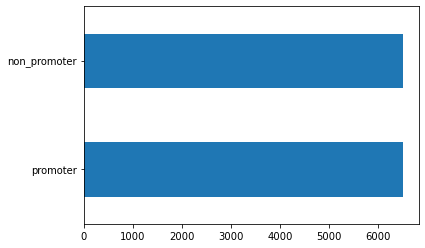

In [51]:
LABEL_COLUMNS = ['promoter', 'non_promoter']
df[LABEL_COLUMNS].sum().sort_values().plot(kind="barh");

In [52]:
sample_row = df.iloc[16]
sample_sequence = sample_row.sequence
sample_labels = sample_row[LABEL_COLUMNS]

print(sample_sequence)
print()
print(sample_labels.to_dict())


GCTGCGGGAATCGAACCCGCATCATTAGCTTGGAAGGCTAAGGTTTTACC

{'promoter': 1, 'non_promoter': 0}


In [53]:
#params
model_name = 'bert-base-cased'
#model_name ='armheb/DNA_bert_5'
'''trained model'''
#tokenizer=AutoTokenizer.from_pretrained('bert-base-cased')
#tokenizer=AutoTokenizer.from_pretrained('xlnet-base-cased')
#tokenizer=AutoTokenizer.from_pretrained('armheb/DNA_bert_5')
tokenizer= PreTrainedTokenizerFast(tokenizer_file="1-BPE.tokenizer.json")
tokenizer.add_special_tokens({'pad_token': '[PAD]'})

check_length=tokenizer(df.sequence[0],add_special_tokens=True, return_tensors="pt")
maxlength = (check_length["input_ids"]).size()[1]
maxlength

52

In [54]:
class PromoterDataset(Dataset):
    def __init__(self, data: pd.DataFrame, tokenizer: tokenizer, max_token_len: int = maxlength):
        self.tokenizer = tokenizer
        self.data = data
        self.max_token_len = max_token_len
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index: int):
        data_row = self.data.iloc[index]
        sequence = data_row.sequence
        labels = data_row[LABEL_COLUMNS]

        encoding = self.tokenizer(
          sequence,
          add_special_tokens=True,
          max_length=self.max_token_len,
          return_token_type_ids=True,
          padding="max_length",
          truncation=True,
          return_attention_mask=True,
          return_tensors='pt',
        )
        return dict(
          sequence=sequence,
          input_ids=encoding["input_ids"].flatten(),
          attention_mask=encoding["attention_mask"].flatten(),
          token_type_ids=encoding["token_type_ids"].flatten(),
          labels=torch.FloatTensor(labels)
        )

In [55]:
train_dataset = PromoterDataset(
  train_df,
  tokenizer,
  max_token_len=maxlength
)
test_dataset = PromoterDataset(
  test_df,
  tokenizer,
  max_token_len=maxlength
)
sample_item = train_dataset[0]
sample_item.keys()

dict_keys(['sequence', 'input_ids', 'attention_mask', 'token_type_ids', 'labels'])

In [56]:
class PromoterDataLoader(pl.LightningDataModule):

  def __init__(self, train_df, test_df, tokenizer, batch_size=8, max_token_len=maxlength):
    super().__init__()
    self.batch_size = batch_size
    self.train_df = train_df
    self.test_df = test_df
    self.tokenizer = tokenizer
    self.max_token_len = max_token_len

  def setup(self, stage=None):
    self.train_dataset = PromoterDataset(
      self.train_df,
      self.tokenizer,
      self.max_token_len
    )

    self.test_dataset = PromoterDataset(
      self.test_df,
      self.tokenizer,
      self.max_token_len
    )

  def train_dataloader(self):
    return DataLoader(
      self.train_dataset,
      batch_size=self.batch_size,
      shuffle=True,
      num_workers=0
    )

  def val_dataloader(self):
    return DataLoader(
      self.test_dataset,
      batch_size=self.batch_size,
      num_workers=0
    )

  def test_dataloader(self):
    return DataLoader(
      self.test_dataset,
      batch_size=self.batch_size,
      num_workers=0
    )

In [57]:
data_module = PromoterDataLoader(
  train_df,
  val_df,
  tokenizer,
  batch_size=32,
  max_token_len=maxlength
)

In [58]:
class PromoterModel(pl.LightningModule):
    

  def __init__(self, n_classes: int, n_training_steps=None, n_warmup_steps=None):
    super().__init__()
    self.bert = BertForSequenceClassification.from_pretrained(model_name,\
                                          num_labels =n_classes,\
                                          output_hidden_states=True,\
                                          output_attentions=True,
                                          return_dict=False)
    self.n_training_steps = n_training_steps
    self.n_warmup_steps = n_warmup_steps
    self.criterion = nn.BCELoss()

  def forward(self, input_ids, attention_mask, token_type_ids=None, labels=None):
    output = self.bert(input_ids, attention_mask=attention_mask)[0]
    output = torch.sigmoid(output)    
    loss = 0
    if labels is not None:
        loss = self.criterion(output, labels)
    return loss, output

  def training_step(self, batch, batch_idx):
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    token_type_ids = batch["token_type_ids"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, token_type_ids, labels)
    self.log("train_loss", loss, prog_bar=True, logger=True)
    return {"loss": loss, "predictions": outputs, "labels": labels}

  def validation_step(self, batch, batch_idx):
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    token_type_ids = batch["token_type_ids"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, token_type_ids, labels)
    self.log("val_loss", loss, prog_bar=True, logger=True)
    return loss

  def test_step(self, batch, batch_idx):
    input_ids = batch["input_ids"]
    attention_mask = batch["attention_mask"]
    token_type_ids = batch["token_type_ids"]
    labels = batch["labels"]
    loss, outputs = self(input_ids, attention_mask, token_type_ids, labels)
    self.log("test_loss", loss, prog_bar=True, logger=True)
    return loss

  def training_epoch_end(self, outputs):
    
    labels = []
    predictions = []
    for output in outputs:
      for out_labels in output["labels"].detach().cpu():
        labels.append(out_labels)
      for out_predictions in output["predictions"].detach().cpu():
        predictions.append(out_predictions)

    labels = torch.stack(labels).int()
    predictions = torch.stack(predictions)

    for i, name in enumerate(LABEL_COLUMNS):
      class_roc_auc = auroc(predictions[:, i], labels[:, i])
      self.logger.experiment.add_scalar(f"{name}_roc_auc/Train", class_roc_auc, self.current_epoch)


  def configure_optimizers(self):

    optimizer = torch.optim.AdamW(self.parameters(), lr=1e-5)
    #optimizer = torch.optim.SGD(self.parameters(), lr=0.01)

    scheduler = get_linear_schedule_with_warmup(
      optimizer,
      num_warmup_steps=self.n_warmup_steps,
      num_training_steps=self.n_training_steps
    )

    return dict(
      optimizer=optimizer,
      lr_scheduler=dict(
        scheduler=scheduler,
        interval='step'
      )
    )

In [59]:
#model parameters 
N_EPOCHS = 50
BATCH_SIZE = 16
steps_per_epoch=len(train_df) // BATCH_SIZE
total_training_steps = steps_per_epoch * N_EPOCHS
warmup_steps = total_training_steps // 5
warmup_steps, total_training_steps

(5850, 29250)

In [60]:
model = PromoterModel(
  n_classes=len(LABEL_COLUMNS),
  n_warmup_steps=warmup_steps,
  n_training_steps=total_training_steps 
)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at b

In [61]:
!TOKENIZERS_PARALLELISM= false
!rm -rf lightning_logs/
!rm -rf training_checkpoints/

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [62]:
%load_ext tensorboard
%tensorboard --logdir ./lightning_logs --host localhost --port 6253

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [63]:
bc = ModelCheckpoint(
  dirpath="training_checkpoints",
  filename="best-checkpoint",
  save_top_k=1,
  verbose=True,
  monitor="val_loss",
  mode="min"
)
ec = EarlyStopping(monitor='val_loss', patience=20)
logger = TensorBoardLogger("lightning_logs", name="promoter-analysis")

In [64]:
trainer = pl.Trainer(auto_lr_find=True,
  logger=logger,
  callbacks=[bc,ec],
  max_epochs=N_EPOCHS,
  gpus=1)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [65]:
import pytorch_lightning.callbacks as pt_callbacks
from torchmetrics.functional import accuracy
trainer.fit(model, data_module)

Missing logger folder: lightning_logs/promoter-analysis
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type                          | Params
------------------------------------------------------------
0 | bert      | BertForSequenceClassification | 108 M 
1 | criterion | BCELoss                       | 0     
------------------------------------------------------------
108 M     Trainable params
0         Non-trainable params
108 M     Total params
433.247   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/home/hane/anaconda3/envs/ML/lib/python3.8/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:240: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/home/hane/anaconda3/envs/ML/lib/python3.8/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:240: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 0, global step 293: 'val_loss' reached 0.69315 (best 0.69315), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 1, global step 586: 'val_loss' reached 0.69260 (best 0.69260), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 2, global step 879: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 3, global step 1172: 'val_loss' reached 0.69089 (best 0.69089), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 4, global step 1465: 'val_loss' reached 0.56190 (best 0.56190), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 5, global step 1758: 'val_loss' reached 0.49447 (best 0.49447), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 6, global step 2051: 'val_loss' reached 0.40000 (best 0.40000), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 7, global step 2344: 'val_loss' reached 0.34605 (best 0.34605), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 8, global step 2637: 'val_loss' reached 0.31130 (best 0.31130), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 9, global step 2930: 'val_loss' reached 0.30326 (best 0.30326), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 10, global step 3223: 'val_loss' reached 0.28148 (best 0.28148), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 11, global step 3516: 'val_loss' reached 0.26810 (best 0.26810), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 12, global step 3809: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 13, global step 4102: 'val_loss' reached 0.26085 (best 0.26085), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 14, global step 4395: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 15, global step 4688: 'val_loss' reached 0.24132 (best 0.24132), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 16, global step 4981: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 17, global step 5274: 'val_loss' reached 0.23002 (best 0.23002), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 18, global step 5567: 'val_loss' reached 0.22745 (best 0.22745), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 19, global step 5860: 'val_loss' reached 0.22146 (best 0.22146), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 20, global step 6153: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 21, global step 6446: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 22, global step 6739: 'val_loss' reached 0.21368 (best 0.21368), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 23, global step 7032: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 24, global step 7325: 'val_loss' reached 0.20575 (best 0.20575), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 25, global step 7618: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 26, global step 7911: 'val_loss' reached 0.20108 (best 0.20108), saving model to '/mnt/f/ML/pytorch/DNABERT/training_checkpoints/best-checkpoint.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

Epoch 27, global step 8204: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 28, global step 8497: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 29, global step 8790: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 30, global step 9083: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 31, global step 9376: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 32, global step 9669: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 33, global step 9962: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 34, global step 10255: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 35, global step 10548: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 36, global step 10841: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 37, global step 11134: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 38, global step 11427: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 39, global step 11720: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 40, global step 12013: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

Epoch 41, global step 12306: 'val_loss' was not in top 1
/home/hane/anaconda3/envs/ML/lib/python3.8/site-packages/pytorch_lightning/trainer/trainer.py:726: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [66]:
trainer.test(model,data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/hane/anaconda3/envs/ML/lib/python3.8/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:240: PossibleUserWarning: The dataloader, test_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.30346351861953735    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.30346351861953735}]

In [67]:
trained_model = PromoterModel.load_from_checkpoint(
  trainer.checkpoint_callback.best_model_path,
  n_classes=len(LABEL_COLUMNS)
)

trained_model.to(device)
trained_model.eval()
trained_model.freeze()

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at b

In [68]:
trained_model.to(device)
trained_model.eval()
trained_model.freeze()
trainer.test(trained_model,data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/hane/anaconda3/envs/ML/lib/python3.8/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:240: PossibleUserWarning: The dataloader, test_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.20107677578926086    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.20107677578926086}]

In [69]:
import random
def gen_seq(length=int):
    nul=("A","T","G","C")
    string, seq=[],[]
    for i in range(length):
        string.append(random.choice(nul))
        seq="".join(string)
    return seq

In [70]:
#generate random seq list 
l_np3= []
for i in range (500):
    l_np3.append(gen_seq(50))

In [71]:
val2_df = pd.DataFrame (l_np3, columns = ['sequence'])
val2_df['promoter']=0
val2_df['non_promoter']=1
val_list=[]
val2_df['seq2']=val2_df['sequence']

THRESHOLD = 0.5
val2_dataset = PromoterDataset(
  val2_df,
  tokenizer,
  max_token_len=maxlength
)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
trained_model = trained_model.to(device)

predictions = []
labels = []

for item in tqdm(val2_dataset):
  _, prediction = trained_model(
    item["input_ids"].unsqueeze(dim=0).to(device), 
    item["attention_mask"].unsqueeze(dim=0).to(device),
    item["token_type_ids"].unsqueeze(dim=0).to(device),
  )
  predictions.append(prediction.flatten())
  labels.append(item["labels"].int())

predictions = torch.stack(predictions).detach().cpu()
labels = torch.stack(labels).detach().cpu()

  0%|          | 0/500 [00:00<?, ?it/s]

In [72]:
val2_df.sequence[0]

'GCACACGGATCCCGACGATTCGAGCCCCAATTAATGAGTCTTTGCCCCTT'

In [73]:
accuracy(predictions, labels, threshold=THRESHOLD) 

tensor(0.8950)

In [74]:
print("AUROC per tag")
for i, name in enumerate(LABEL_COLUMNS):
  tag_auroc = auroc(predictions[:, i], labels[:, i], pos_label=1)
  print(f"{name}: {tag_auroc}")

AUROC per tag
promoter: 0.0
non_promoter: 0.0


/home/hane/anaconda3/envs/ML/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: No positive samples in targets, true positive value should be meaningless. Returning zero tensor in true positive score
  warnings.warn(*args, **kwargs)
/home/hane/anaconda3/envs/ML/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: No negative samples in targets, false positive value should be meaningless. Returning zero tensor in false positive score
  warnings.warn(*args, **kwargs)


In [75]:
y_pred = predictions.numpy()
y_true = labels.numpy()

upper, lower = 1, 0

y_pred = np.where(y_pred > THRESHOLD, upper, lower)

print(classification_report(
  y_true, 
  y_pred, 
  target_names=LABEL_COLUMNS, 
  zero_division=0
))

              precision    recall  f1-score   support

    promoter       0.00      0.00      0.00         0
non_promoter       1.00      0.90      0.95       500

   micro avg       0.89      0.90      0.90       500
   macro avg       0.50      0.45      0.47       500
weighted avg       1.00      0.90      0.95       500
 samples avg       0.89      0.90      0.89       500



In [76]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
trained_model = trained_model.to(device)

val_dataset = PromoterDataset(
  val_df,
  tokenizer,
  max_token_len=maxlength
)

predictions = []
labels = []

for item in tqdm(val_dataset):
  _, prediction = trained_model(
    item["input_ids"].unsqueeze(dim=0).to(device), 
    item["attention_mask"].unsqueeze(dim=0).to(device),
    item["token_type_ids"].unsqueeze(dim=0).to(device)
  )
  predictions.append(prediction.flatten())
  labels.append(item["labels"].int())

predictions = torch.stack(predictions).detach().cpu()
labels = torch.stack(labels).detach().cpu()

  0%|          | 0/2602 [00:00<?, ?it/s]

In [77]:
val_df=val_df.reset_index(drop=True)
val_df.sequence[0]

'ATTCAATTCAAAGACAAGCGATCACAATTCGAGCTTTTTTGAAGTATGCG'

In [78]:
accuracy(predictions, labels, threshold=THRESHOLD)

tensor(0.9193)

In [79]:
print("AUROC per tag")
for i, name in enumerate(LABEL_COLUMNS):
  tag_auroc = auroc(predictions[:, i], labels[:, i], pos_label=1)
  print(f"{name}: {tag_auroc}")

AUROC per tag
promoter: 0.9708003401756287
non_promoter: 0.9707866311073303


In [80]:
y_pred = predictions.numpy()
y_true = labels.numpy()

upper, lower = 1, 0

y_pred = np.where(y_pred > THRESHOLD, upper, lower)

print(classification_report(
  y_true, 
  y_pred, 
  target_names=LABEL_COLUMNS, 
  zero_division=0
))


              precision    recall  f1-score   support

    promoter       0.93      0.91      0.92      1297
non_promoter       0.91      0.93      0.92      1305

   micro avg       0.92      0.92      0.92      2602
   macro avg       0.92      0.92      0.92      2602
weighted avg       0.92      0.92      0.92      2602
 samples avg       0.92      0.92      0.92      2602



In [ ]:
trainer.save_checkpoint("length50nu-1bp.ckpt")
#trained_model = PromoterModel.load_from_checkpoint(checkpoint_path="length50nu-1bp.ckpt", n_classes=2)

In [82]:
def pred(sequence):
    encoding = tokenizer(
        sequence,
        max_length=maxlength,
        return_tensors='pt',
    )
    encoding.to(device)
    _, test_prediction = trained_model(encoding["input_ids"], encoding["attention_mask"], encoding["token_type_ids"])
    test_prediction = test_prediction.detach().cpu().flatten().numpy()
    return test_prediction[0]

In [82]:
generated_prom= []
n=0
while n <1000:
    inp = gen_seq(50)
    out = pred(inp)
    if out>0.99:
        generated_prom.append(inp)
        print(inp)
        n+=1

TACAGTCGGCCCGCTAGTTCGCCCTAGTGAAAAAGCTGGCATTATCATGA
TAGCAGACACCACCCCTTCGCCAAAAGATATGGTTGCGTAGTCTAGCGTC
TGTGCTCCTTGGACAGTCACTGAAACGGGAACTCCGATGATAATGTTAAC
GCCGCCCCCACGTTTTTGTACGTGGCGAGCGGTTCAAGTATAATTTAACT
AGTGGTTACCGGACTCGCATGCCTAACGTACGGTTGCATAGTTGTGTGGC
ATAAGCATGGGAGGTTCGAGATTCCGAATAGAATTTCTAACATGGTACGC
AGCTAGAAGACCGTCGGGAAAGTCGCAGCTAAAGTGTGATAGATATGTGT
AAATTTAGGTTTCGGTATAGCATTGGAGTGAGTAGGACTAGAATAGCCAT
ACCGAGCGAGCTCCCCATCTGATTAAACGGGTCCATCGCCACATTGGTAG
CCGAAGACGGGCAGGCCTTTGAGAAAACATCAGTGCGCCTAAAATCCTCA
CATTTTGGGGTCTGTAAGCTCGCGTGTGGGCTTGGGCTTTAAAGTATGGC
TACCTTATTAATCTTCTTTTTAACTCGCAATAGATTCTTAAAATATAGGA
CAAGCTCCGAGCGCCGGCATAACCTCTGCTCCGAGGTCGGATGATGACAA
GGGAATTGGTCCCGGTTAACCTAGTCAATCGCATGCCTTATTATAAAGTG
AGGGTGTGTAATTATTGCTGTCGATTCCGCAGATAAGATACCCTCGGACT
GAGCATTTGAATGCCGCGGACTCGTGTACAGCAAGCATAAAATAAGTCGA
CTGCTAATGTCACAGCCACCTAGAGGTATGCCGTGTGGTACGGTGAAGAT
GGCTTACAGCCCTATACAGACGGCACCGGCACATTGGTGTACTTAGAGAT
ACGTCTTAATTAGTCTGTGATATGTCAGGATGTTGGGTTACTATTGCTGA
GCGTCGCGACGTCTGTTGACACCAGCTAGGC

GTCTGGTGTGAGTCTTTGGGTCCTGCTCGGGTAAACCCTATAGTTTATGT
CTCGATAGCTTCAGTGCGGGTGCATTACGTCAAGCGATACCCTGGGCGGG
ATTCAGAGTTAGGGGGATCGAGGACGTCCCACCGGCCGTCAAGCTGGGTT
GCTTCATGCGACCATAAGCATCAGTACCATTTCAGGAGTTATACTTACGG
AATACGCGCCGCCACAAAGAGCCTGGCCTGAAGTGGTTTAGGCTTAATTA
CGGGGCTCCCTGGGCCCGACATCACCCACTAATAATGGATGATTTTTTTT
GACGGCTACTCACGGGTATGCTATGCGCCTCGACGGCTTATCCTGAACAC
CGCTCTTGAGGTTCACTCCAGAGACTTTTGCGCGCCCTAGCCTACAGGAT
CCATCGTACGCGAGGCAACTCATCGAACGGCCCCAGATAAATAGGGGTAT
GATTAGTTCACGTGAGCGCACCGAAAAGGTATAGTTTTTATGCTATATAT
GCATGCAGGGGCAGGCGGCCCTCGATACCTTGAAAAGCCTATATTGGAAA
TACTAGAAAGCCCGCGTGTTTATGATGCCAACCGAAAATTAGATAGTAGA
AAGTCTGATCGTACCGGCGGCCAAACCGCATCAGCACCTGAAGATTAGGA
CAAACCGGGGACCGGTCACACCTACGAGAGGGCAAGCTGCTATAAGGTGT
TGCGTCCAGTACCGAGATTGACATGAGCACTGACGACATAATATAATCAT
GCTGTGAGGAGAGCCGCGGCCCACTATATAGACGTGGTACATAATCTGAA
AGAATCCAGAACGAGTCAGTTCTCCCAAAGGCTACTTGGTCTAATTTGGG
GTTCTAGTTCACACTACGGGTCCACCTCCCCCCATGGCGATAATTACTCA
CTAACGAGTTATCTTCGCCCCCAGTCACAGAGTCGGATAACGTCATCCCT
TACAGGTGAATGCCACAGTAGCTTGCCAGTC

CAACTTTCTAGTTTCGCCAATTCGATGAAACCCTGACTGTACGTTGACGT
GCTATCAAATCCTAACAACCTCCCCTTGGGTTAGAGCGTAAATTTAGTTC
GGGTGAATATCCACATGATCATGAGAGAAAATCCGGCCTATCGTATTATA
ATAGCGACTCAGCTGCAGCTCCGGACTATGAATACGCACTACAAATAAGT
GTAGCGCGTGATGACGCATTATGATCTTAGCTGATCGGGTAAACTGTACA
CCAACTATTGCCTTGGCTCACAGTGTGGTGCCCTTGTGAAGAATAGGCGT
CGCTAGCAAAGCCCCGTTTACAGAGCAGGCTAAGGGGCAAGTTGGATTAT
GACGGTTTTCAGTTTATCAATATGCAAGAAATTTGCGCTAGCGTTAATCG
GTTAGAAACGTGCCCTCAAAGAAGACGCAAGTTTCCGGCTAAAAAAAAGT
GAGCACTGGAAGACGCGATCCTGGCAGATCTTGCCCTTTTAAGTTGGTTG
TTACTGTTGCACACCCGTAAATATTAGCGGTGATAAACTAGCGTATGAGG
CTCCTCAGCTATTAGCAACAATGCGGTGTTCCGGAACAGTAAAATGCGCC
CATATAAGCCACGAGCTGAACATTTGTGGGAGGGGAGGATAGCATGAAAC
GCCAACCTACGTACCCGTTCAGAGGGCTCATCTGTCGGCTATATAGTCGC
GCAAGTAGATTGCTTGGCCCGAGGAAACGTGCGCTCAATAGGGTTAAGGT
CGACCCTATGCGCCCGCTCTCACTCCTTTGAATCATAATTACATGTGGCT
CCATTCAGTTTGTAAAATCAAAGATCAGCGCGCGTTGTAAAGTCTATTTG
GACAGAATCGAGATACGTCGGCAACGTACTCGCTGTGAGAAGCTAAGACC
AAGGCCGTCCGGTTTTGCCGGAAGCGAATGACTGACATTAGGATGTATTG
CTGATGGCAGACCCCCTCCATGCCCGGTTTT

CACACTGGATAGATGCGCTGTACACAATATAAGCCGGATTAGGCTGGAGG
CATCGTCTGGTGGACCGGATCACAGGCCGTGACGGATGCGAAGGTGGTGG
TCAGGGAAGCTTCCGGTCAACCTGGTAACAACGGTGGTAGACCATATTGT
AAGCTAGTTAGACTCTTTCATCATTTTCCCAAAGTTTTGGATATTATTCG
ATAGGTTCTTTACAAACCTCGTCCAGGTTGACTACCTTCCATATTATGTT
CGTGCCTCCTACGTATAGTGTCAGTATGCTGATTTGGATCATAGTAAGGG
ACGGGGACAAACTGGAGAATTCGATCATTCTACCCATGAGATGATAACAA
AGGGCTTATACCCCGGCGATAGCTAATGGCATCCCAAGTAATAATGTTAC
CAAAAGTCTACAAGAGTCCAAGGAAGTGGAAGAGCGCTATATTCAGGGGC
AGACAAAGTACATTAGGTCTAAGAGCCTAGCGCAAAGGTTAGCCTGGGTA
AAGCCCCCAGCTGCTTGTAATGCACATTCGGTTTGGAGGTATGCTCTCAG
CGGTGGCCGATTCTCCCCGGGGATTTAGGCCTTCAGGTCTACTATTGTTT
CGGCAGCGCCCAAGTTGTGGGCTACGGTATAGAAACGCTACCCTTGGGGG
TCTAGACAATACTTCTTCGGCTCCAGTAGGAGTGGACGTTATGGTGTTCT
TATAAATTCAATGAAGCTAGATACTAAATGATTATTGACTAAGATTGCGG
GCAACTAAGGTTCGCAGTCACCCAAACCACTGCTATGGTCAAGATAGACC
ACTCGTGTCTAAACCGTGTACGAACATGGACGATACTTGTAACATGCTGT
GTGCTGAATGGGTATTAATCAAACCAGAGCCTAGTCCTGAAACTAGGAGG
GTCTTGACTAAAGTAACTCTCCACGTTCTTCTGCGAATTACGTTGGCCAT
TGAAGCTCCCCACGTGGGAAGCTTTTGGACA

TGTCGAGATGAAATTGCAGCGCGTACACCCTACGTTACTAGTATAGGACA
AGGCACGGACGATGATGCGGCACCGCATGTATGTGTGGTTAATTAGGTGG
ATACGGTTACTGCTGGTTGTAAAACCCCGCTTATCGTGATAATAATTAGG
AGGGGGCCGACATGACTGAACTATGCTAAGCAATGGGTAAACTAGAAGAG
GTGCTTCCACGGCCCGTCATAGGGTACCCAGCTGACATATTATGGGTCTC
AGCGAGGGCCTATACGGACTACGCAGCAAGTAATGGCGTAATATTTCAAT
TACCGTCGGTCAAGCAGTCGATGGCTCTTGTCATACTCTACAATGCGAGA
GGCCGATGGAAACTACCAAGCTTGCACTGTCGGCTCCTGATAATCTGAAG
GTAAAAATTCACCGTGAGGCAGTCGTGAGACGATGTGAGATACTTTGGAT
AGTGTCTTTCTGGATTCAAAACCAAAGTCATTCTCTGGTACTGTCAGACT
TTTGTCTTTAGGTGATCAACAGACCTAGATCGCCGCACTATTATCAATTG
CGGACATCGTACGGGTAAAAAATGACCGAGCTAATGTGCTACTATCGCTT
CAAACCCATTTTCCACCGCCGCTTTTACACGATTAATGCCACAATAATGT
TTATCGGCCATACCTTTATCTCTACACCGCTTGTCGCCTGAAAATTGTAT
GAGCCCGAAGGAGGGTACTGCGAGCAGCCGACCCATCATAAAAAAGGGAG
TTTATTGTCGGAATCAAGAAAGGAGGTGCACCGCTTGTTTATGGTTAAAC
CCCCACCCCTCACCAGAGATGTCCATTTGGTACGGCGGGTATGGTGTCCC
AGACAAGACACGAGTCTTTCCCCGGTGCGCACGCAGGGGCGATACAATAA
CCCCTTCCTCATACCACGCCGCTAAGAAGGCCTATCAGTATAGAATCGAG
AATCCCGCGGTAAATTCATCTTCTTACTGAC

TCAAGACTCGTGGCTTTACACCCTTTACTTCATACACATATGCTTGTACT
ATGTGAAGTCCGGCCACTTGTAGGGACCCGTAATCTTGTTAGTGTCTAGT
GTGGGTGGGGTTTGGCACCGTAGTCCCCCCGCGGTTGCTAGCCTAGCTTG
GGGGAGAAATCGGCCCAGCCCTCTCGGTGCTCCGCTGAGAATATAAATCC
TATTTTTTTAGCTTGACCCGTCAAGAGGTATCCTAATGGCATGATACAGT
ATACGCCCAAAAGCCAGTAACATCAACGCGACGTTCTGCTTATATTTGTG
GTTGTCATGAAGGGCATGTCGCCTGGATCGGAAGGATGTAACATTGATCA
TTCTGTAGCCGCCCCATTTATTAATACCGAACCCTCTTTAAAAATACTAC
CAGTTAGAATCCGGCCTATTACTTCGGAAAGAGCTTGGTATACTTTATGG
TTGGAAGAAAGGTTCCTAAAGATCGTGGAAGAGCTTTGATACAATTGGTA
CTCATTAACGCGCCTCAGCACTTCCTACTACCGCATGGCAACTTGAAGGG
AACGCCTCTCCTAAATCGACAGGCGTTCGTACTTACTCTATGATCCTAAC
CGTGTGAAGCTCTTTCTAATCTACTGTGGATCCTCCTTGTACATTTCTGG
AGCTCGCATGTGAAGGTTGCCAGCAGATTAAGGTCCTGGAAAATGATAAT
GGCTATGTCACTAAGCGCTCGGCGACATGTGATCAGATTATACTGATTCA
GGACTCCTAGCGGAGGGCAGCCGCACGGACGCCCCGGTTATACACTTGAT
GTCCACTGGCGGACGTAAGACTACAAGACCCAAATCTCTTTTAATACCGG
TCTTTTACCTTGTGATAACACAGTGACTATTTGGAAGGTACTGTGTACGT
TGAGAGATCGCTAGGCAAGCCCGCTCAGTCCTGAATTATAATAAGAAGAC
AAGGTTTGCTAGGTCCGGCAGCACTAAAGCT

GGGAATAGGAGCACGTTCATATGAGCCCTCGAGAAGGGTGACCCTGGAAG
CCGTGCCACCTGGCTCCTGCTCCCGGTCGAGCGAGTGCCACCTTGTGACT
ATGGGGATGCACATTACAAACACACTCACCGGGGTGGTACTATTGGGCGT
GTCTTAAATCAGTAGGTCATCCAGGGGCCGTGGACGGGCTAAGCTCAAGC
GATCACCATATCAATGATACCCCACCCCACTGGCCGTACATGATGAGTGA
TGAATTGTGGCGGGCAACGTCGCGGTGACGTCAATGTGGCACAATACCAA
TACAATAATCACGCCTCGACAGCGTCCACCGACAATGATATGATCAGGTT
CTTCGTTTCCCAGGTCCATTGTTCGGTGCCACGTTGTCACACTCGAGGGG
CTAGCGATCATCGGAGCTAGCGGAGAATGTCGGCTGTTAATATTTTAAGG
CCCAAGTCAGGGTATGCTTGCCCCCCAAAAAAATACGGGATGATTTTGAG
CAACCGTGTAGCATCCGTAGAGGAGTATACTCTTTTGGACAATTTAGGGA
GCACAACGCGCCTGGGACGGTAAGGAAAACGGACCTGATAACGTATATGG
CCCCCCGTCACCACACGGTATATGTTGGATACGGCCTGATATATTGGGAC
CAATCCTGGATCGTACACACACATAACGGCTGTCCTAGTATGGTTTGGGA
TGCTGCTACGTCAACCATGGTAGACCGCAATACTGGTTAGCCTAGTGCAC
AAATGAATGACCGGTTTCGTTATCCCCGACTCTAGTACTAGTCTGAGTAA
CAGGTTAGCCCACTTAATAAGCGTGGCACATGTTTGCTAGATTGAAGCCC
CCATCATTCAGTGTATATACGTGGTGTTCATGGCTGACGTATCCTCTCGG
CACGTAGTCTCGTGGGAGCCTGATGGTAGTCGGAGCTGTCAAACTAGAGG
AGGTCCGGACGTAAGTGGCAAGGCAAAAACA

In [50]:
from captum.attr import (IntegratedGradients, LayerIntegratedGradients,
                         configure_interpretable_embedding_layer,
                         remove_interpretable_embedding_layer)
from captum.attr import visualization as viz

In [51]:
def predict(input_ids, attention_mask,token_type_ids):
    return trained_model(input_ids, attention_mask,token_type_ids)[1]

def custom_forward(input_ids, attention_mask, token_type_ids):
    preds = predict(input_ids, attention_mask, token_type_ids)
    return preds.unsqueeze(-1)

def construct_input_ref_pair(text):
    input_ids= tokenizer.encode(text,
                                    add_special_tokens=True,
                                    max_length=maxlength,
                                    return_token_type_ids=True,
                                    padding="max_length",
                                    truncation=True,
                                    return_attention_mask=True,
                                    return_tensors='pt',
                                   )

    seq_len = input_ids.shape[1]
    ref_text = tokenizer.pad_token * (seq_len)
    ref_input_ids = tokenizer.encode(ref_text,
                                    add_special_tokens=True,
                                    max_length=maxlength,
                                    return_token_type_ids=True,
                                    padding="max_length",
                                    truncation=True,
                                    return_attention_mask=True,
                                    return_tensors='pt',
                                   )


    return torch.tensor((input_ids), device=device), torch.tensor((ref_input_ids), device=device), seq_len

def construct_input_ref_token_type_pair(input_ids, sep_ind=0):
    seq_len = input_ids.size(1)
    token_type_ids = torch.tensor([[0 if i <= sep_ind else 1 for i in range(seq_len)]], device=device)
    ref_token_type_ids = torch.zeros_like(token_type_ids, device=device)# * -1
    return token_type_ids, ref_token_type_ids

def construct_input_ref_pos_id_pair(input_ids):
    seq_length = input_ids.size(1)
    position_ids = torch.arange(seq_length, dtype=torch.long, device=device)
    ref_position_ids = torch.zeros(seq_length, dtype=torch.long, device=device)

    position_ids = position_ids.unsqueeze(0).expand_as(input_ids)
    ref_position_ids = ref_position_ids.unsqueeze(0).expand_as(input_ids)
    return position_ids, ref_position_ids
    
def construct_attention_mask(input_ids):
    return torch.ones_like(input_ids)

def summarize_attributions(attributions):
    attributions = attributions.sum(dim=-1).squeeze(0)
    attributions = attributions / torch.norm(attributions)
    return attributions

def get_topk_attributed_tokens(attrs, k=5):
    values, indices = torch.topk(attrs, k)
    top_tokens = [all_tokens[idx] for idx in indices]
    return top_tokens, values, indices

def custom_forward_2(input_emb, attention_mask=None, position=0):
    pred = trained_model.bert.bert(inputs_embeds=input_emb, attention_mask=attention_mask, )
    pred = pred[position]
    return torch.max(pred).unsqueeze(-1)
def construct_whole_bert_embeddings(input_ids, ref_input_ids, \
                                    token_type_ids=None, ref_token_type_ids=None, \
                                    position_ids=None, ref_position_ids=None):
    input_embeddings = trained_model.bert.bert.embeddings(input_ids, token_type_ids=token_type_ids, position_ids=position_ids)
    ref_input_embeddings = trained_model.bert.bert.embeddings(ref_input_ids, token_type_ids=ref_token_type_ids, position_ids=ref_position_ids)
    
    return input_embeddings, ref_input_embeddings

lig = LayerIntegratedGradients(custom_forward, trained_model.bert.bert.embeddings)

In [52]:
#inferencing target
#text = val_df.sequence[5]
text = "AATTCCGTTTCTAGGAAAAAATGTTATCTTTAGATGCGTTAAAATCGACT"
print(text)

AATTCCGTTTCTAGGAAAAAATGTTATCTTTAGATGCGTTAAAATCGACT


In [53]:
#text= kmer_split(text) #for using a tokenizer with different kmer length 
encoding = tokenizer(
  text,
  max_length=maxlength,
  return_tensors='pt',
)
encoding.to(device)

_, test_prediction = trained_model(encoding["input_ids"], encoding["attention_mask"], encoding["token_type_ids"])
test_prediction = test_prediction.detach().cpu().flatten().numpy()
attention = trained_model.bert(encoding["input_ids"], encoding["attention_mask"])[-1]   # Output includes attention weights when output_attentions=True
tokens = tokenizer.convert_ids_to_tokens(encoding["input_ids"][0]) 


for label, prediction in zip(LABEL_COLUMNS, test_prediction):
  print(f"{label}: {prediction}")


input_ids, ref_input_ids, seq_len = construct_input_ref_pair(text)
token_type_ids, ref_token_type_ids = construct_input_ref_token_type_pair(input_ids, seq_len)
position_ids, ref_position_ids = construct_input_ref_pos_id_pair(input_ids)
attention_mask = construct_attention_mask(input_ids)
indices = input_ids[0].detach().tolist()
all_tokens = tokenizer.convert_ids_to_tokens(indices)
input_ids_u=(input_ids, attention_mask, token_type_ids)
ref_input_ids_u=(ref_input_ids, attention_mask, ref_position_ids)
attributions, delta = lig.attribute(inputs=input_ids_u,
                                    baselines=ref_input_ids_u,
                                    n_steps=200,
                                    internal_batch_size=3,
                                    target=0, #0 = comparing to possitive sentiment
                                    return_convergence_delta=True)
score = predict(input_ids, attention_mask, ref_position_ids)
score
y_pred=score.cpu().detach().flatten().numpy()
THRESHOLD = 0.5
upper, lower = 1, 0
y_pred = np.where(y_pred > THRESHOLD, upper, lower)
attributions_sum = summarize_attributions(attributions)
# storing couple samples in an array for visualization purposes
score_vis = viz.VisualizationDataRecord(attributions_sum,
                                        score.max().item(),
                                        y_pred[0],
                                        1,
                                        1,
                                        attributions_sum.sum(),       
                                        all_tokens,
                                        delta)
viz.visualize_text([score_vis])

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/tmp/ipykernel_386/1307844842.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor((input_ids), device=device), torch.tensor((ref_input_ids), device=device), seq_len


promoter: 0.9952160120010376
non_promoter: 0.004281273111701012


In [58]:
from bertviz import head_view
#head_view(attention, tokens)

In [59]:
from bertviz import model_view
model_view(attention, tokens, display_mode="light")

In [91]:
#multi inferencing 
def interpret_sequence(model, sentence, max_len = maxlength, label = 0):
  trained_model.zero_grad()
  input_ids, ref_input_ids, seq_len = construct_input_ref_pair(sentence)
  token_type_ids, ref_token_type_ids = construct_input_ref_token_type_pair(input_ids, seq_len)
  position_ids, ref_position_ids = construct_input_ref_pos_id_pair(input_ids)
  attention_mask = construct_attention_mask(input_ids)
  indices = input_ids[0].detach().tolist()
  temp_all_tokens = tokenizer.convert_ids_to_tokens(indices)
  input_ids_un=(input_ids, attention_mask, token_type_ids)
  ref_input_ids_un=(ref_input_ids, attention_mask, ref_position_ids)
  
  attributions, delta = lig.attribute(inputs=input_ids_un,
                                    baselines=ref_input_ids_un,
                                    n_steps=500,
                                    internal_batch_size=3,
                                    target=0, #0 = comparing to promoter
                                    return_convergence_delta=True)
  attributions_sum = summarize_attributions(attributions)

  _, prediction = trained_model(input_ids, attention_mask)
  prediction = prediction.detach().cpu().flatten().numpy()
  score = predict(input_ids, attention_mask, ref_position_ids)
  y_pred=score.cpu().detach().flatten().numpy()
  THRESHOLD = 0.5
  upper, lower = 1, 0
  y_pred = np.where(y_pred > THRESHOLD, upper, lower)
  y_pred[0]
  THRESHOLD = 0.5
  upper, lower = 1, 0
  y_pred = np.where(prediction > THRESHOLD, upper, lower)
  for pred_label, pred_confidence in zip(LABEL_COLUMNS, prediction):
    if pred_confidence < 0.5:
      p_label="promoter"
      continue
    else:
      p_label="non promoter"
    print(f"{pred_label}: {pred_confidence}, {delta}")
    
  true_label=label
  vis_data_records.append(viz.VisualizationDataRecord(attributions_sum,
                                        score.max().item(),
                                        y_pred[0],
                                        label,
                                        p_label,
                                        attributions_sum.sum(),       
                                        temp_all_tokens,
                                        delta))

In [136]:
vis_data_records = []
interpret_sequence(trained_model,('GGCGACAGCAAGCAGCCCTCAGCCGTAGACCTATGTGGCACGATCGACGC'), label=1)
interpret_sequence(trained_model,('CGGCAATGACGTAGTACTCTTACAACATACCTATTCGTTATAATATAACC'), label=1)
interpret_sequence(trained_model,('CCATTATTAAAAAAGCGTCCGCTGTCTCTCTTTTCTCGAAAAAGATTTCT'), label=1)
interpret_sequence(trained_model,('CATCTGTATCAGAGATGACTGTTGCTGGCGAGTCGTGGGAATACTCTCAG'), label=1)
interpret_sequence(trained_model,('AACGAAGAATTGCGTCGCATCAATCGTTTGGGTGCCCGTATTGTCAGCAT'), label=1)
interpret_sequence(trained_model,('CATTTGTTAACAAAAAAGGGGTGCCGCCACGGCACGCTCTAATCTAAAAC'), label=1)

/tmp/ipykernel_442/1307844842.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor((input_ids), device=device), torch.tensor((ref_input_ids), device=device), seq_len


promoter: 0.9862261414527893, tensor([-1.6412e-05], device='cuda:0', dtype=torch.float64)
promoter: 0.7342780232429504, tensor([0.0004], device='cuda:0', dtype=torch.float64)
non_promoter: 0.9960628151893616, tensor([9.7015e-05], device='cuda:0', dtype=torch.float64)
promoter: 0.9526689052581787, tensor([0.0002], device='cuda:0', dtype=torch.float64)
promoter: 0.9963172674179077, tensor([0.0003], device='cuda:0', dtype=torch.float64)
promoter: 0.9548324346542358, tensor([2.2138e-05], device='cuda:0', dtype=torch.float64)


In [137]:
print('Visualize attributions based on Integrated Gradients')
_ = viz.visualize_text(vis_data_records)

Visualize attributions based on Integrated Gradients


# Interpreting Bert Layers

In [147]:
text = 'CGGCAATGACGTAGTACTCTTACAACATACCTATTCGTTATAATATAACC'
#val_df.sequence[0]

In [148]:
trained_model.to(device)
trained_model.eval()
trained_model.freeze()

In [149]:
encoding = tokenizer(
  text,
  max_length=maxlength,
  return_tensors='pt',
)
encoding.to(device)
_, test_prediction = trained_model(encoding["input_ids"], encoding["attention_mask"], encoding["token_type_ids"])
test_prediction = test_prediction.detach().cpu().flatten().numpy()

for label, prediction in zip(LABEL_COLUMNS, test_prediction):
  print(f"{label}: {prediction}")

input_ids, ref_input_ids, seq_len = construct_input_ref_pair(text)
token_type_ids, ref_token_type_ids = construct_input_ref_token_type_pair(input_ids, seq_len)
position_ids, ref_position_ids = construct_input_ref_pos_id_pair(input_ids)
attention_mask = construct_attention_mask(input_ids)
indices = input_ids[0].detach().tolist()
all_tokens = tokenizer.convert_ids_to_tokens(indices)
input_ids_u=(input_ids, attention_mask, token_type_ids)
ref_input_ids_u=(ref_input_ids, attention_mask, ref_position_ids)

promoter: 0.7342780232429504
non_promoter: 0.2791977822780609


/tmp/ipykernel_442/1307844842.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor((input_ids), device=device), torch.tensor((ref_input_ids), device=device), seq_len


In [150]:
lig2 = LayerIntegratedGradients(custom_forward, \
                                [trained_model.bert.bert.embeddings.word_embeddings, \
                                 trained_model.bert.bert.embeddings.token_type_embeddings, \
                                 trained_model.bert.bert.embeddings.position_embeddings])

attributions2 = lig2.attribute(inputs=input_ids_u,\
                               baselines=ref_input_ids_u,\
                               target=0,\
                              )
attributions2_word = summarize_attributions(attributions2[0])
attributions2_token_type = summarize_attributions(attributions2[1])
attributions2_position = summarize_attributions(attributions2[2])

In [151]:
top_words_start, top_words_val_start, top_word_ind_start = get_topk_attributed_tokens(attributions2_word)
top_token_type_start, top_token_type_val_start, top_token_type_ind_start = get_topk_attributed_tokens(attributions2_token_type)
top_pos_start, top_pos_val_start, pos_ind_start = get_topk_attributed_tokens(attributions2_position)
df_start = pd.DataFrame({'Word(Index), Attribution': ["{} ({}), {}".format(word, pos, round(val.item(),2)) for word, pos, val in zip(top_words_start, top_word_ind_start, top_words_val_start)],
                   'Token Type(Index), Attribution': ["{} ({}), {}".format(ttype, pos, round(val.item(),2)) for ttype, pos, val in zip(top_token_type_start, top_token_type_ind_start, top_words_val_start)],
                   'Position(Index), Attribution': ["{} ({}), {}".format(position, pos, round(val.item(),2)) for position, pos, val in zip(top_pos_start, pos_ind_start, top_pos_val_start)]})

#['{}({})'.format(token, str(i)) for i, token in enumerate(all_tokens)]

In [152]:
outputs = trained_model(encoding["input_ids"], encoding["attention_mask"])
output_attentions = trained_model.bert(encoding["input_ids"], encoding["attention_mask"])[-1]   
tokens = tokenizer.convert_ids_to_tokens(encoding["input_ids"][0]) 
output_attentions_all = torch.stack(output_attentions)
input_embeddings,ref_input_embeddings= construct_whole_bert_embeddings(input_ids, ref_input_ids)

In [153]:
layer_attrs_start= []
for i in range(0,trained_model.bert.config.num_hidden_layers):
    lc = LayerConductance(custom_forward_2, (trained_model.bert.bert.encoder.layer[i]))
    layer_attributions_start = lc.attribute(inputs=input_embeddings, baselines=ref_input_embeddings, additional_forward_args=(attention_mask,0))
    layer_attrs_start.append(summarize_attributions(layer_attributions_start[0]).cpu().detach().tolist())

In [154]:
all_tokens_with_pos, i,kmer_length=[],(len(all_tokens)-1),1#5
for kmer in all_tokens:
    str1=i*kmer_length
    str2=repr([str1])
    str3=kmer+"_"+str2
    all_tokens_with_pos.append(str3)
    i-=1

['<s>', 'C', 'G', 'G', 'C', 'A', 'A', 'T', 'G', 'A', 'C', 'G', 'T', 'A', 'G', 'T', 'A', 'C', 'T', 'C', 'T', 'T', 'A', 'C', 'A', 'A', 'C', 'A', 'T', 'A', 'C', 'C', 'T', 'A', 'T', 'T', 'C', 'G', 'T', 'T', 'A', 'T', 'A', 'A', 'T', 'A', 'T', 'A', 'A', 'C']


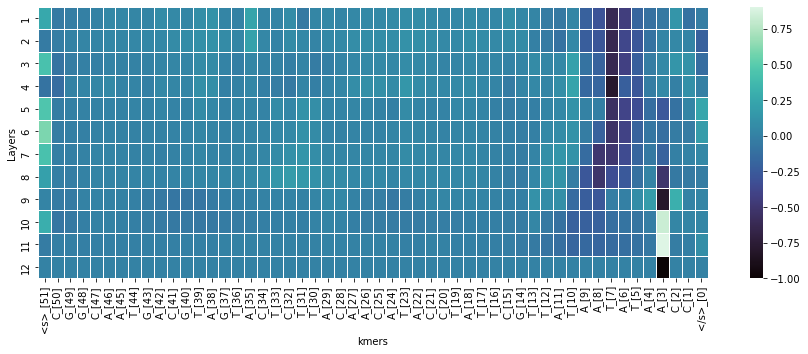

In [155]:
fig, ax = plt.subplots(figsize=(15,5))
xticklabels=all_tokens_with_pos
yticklabels=list(range(1,13))
ax = sns.heatmap(np.array(layer_attrs_start), xticklabels=xticklabels, yticklabels=yticklabels, linewidth=0.5,cmap="mako")
plt.xlabel('kmers')
plt.ylabel('Layers')
print(tokenizer.convert_ids_to_tokens(encoding["input_ids"].squeeze())[:50])
plt.show()

In [132]:
def visualize_token2token_scores(scores_mat, x_label_name='Head'):
    fig = plt.figure(figsize=(50, 50))

    for idx, scores in enumerate(scores_mat):
        scores_np = np.array(scores)
        ax = fig.add_subplot(4, 3, idx+1)
        # append the attention weights
        im = ax.imshow(scores, cmap='viridis')

        fontdict = {'fontsize': 20}

        ax.set_xticks(range(len(all_tokens)))
        ax.set_yticks(range(len(all_tokens)))

        ax.set_xticklabels(all_tokens_with_pos, fontdict=fontdict, rotation=90)
        ax.set_yticklabels(all_tokens_with_pos, fontdict=fontdict)
        ax.set_xlabel('{} {}'.format(x_label_name, idx+1))

        fig.colorbar(im, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()
    
def visualize_token2head_scores(scores_mat):
    fig = plt.figure(figsize=(50, 50))

    for idx, scores in enumerate(scores_mat):
        scores_np = np.array(scores)
        ax = fig.add_subplot(6, 2, idx+1)
        # append the attention weights
        im = ax.matshow(scores_np, cmap='viridis')

        fontdict = {'fontsize': 20}

        ax.set_xticks(range(len(all_tokens)))
        ax.set_yticks(range(len(scores)))

        ax.set_xticklabels(all_tokens_with_pos, fontdict=fontdict, rotation=90)
        ax.set_yticklabels(range(len(scores[0])), fontdict=fontdict)
        ax.set_xlabel('Layer {}'.format(idx+1))

        fig.colorbar(im, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()


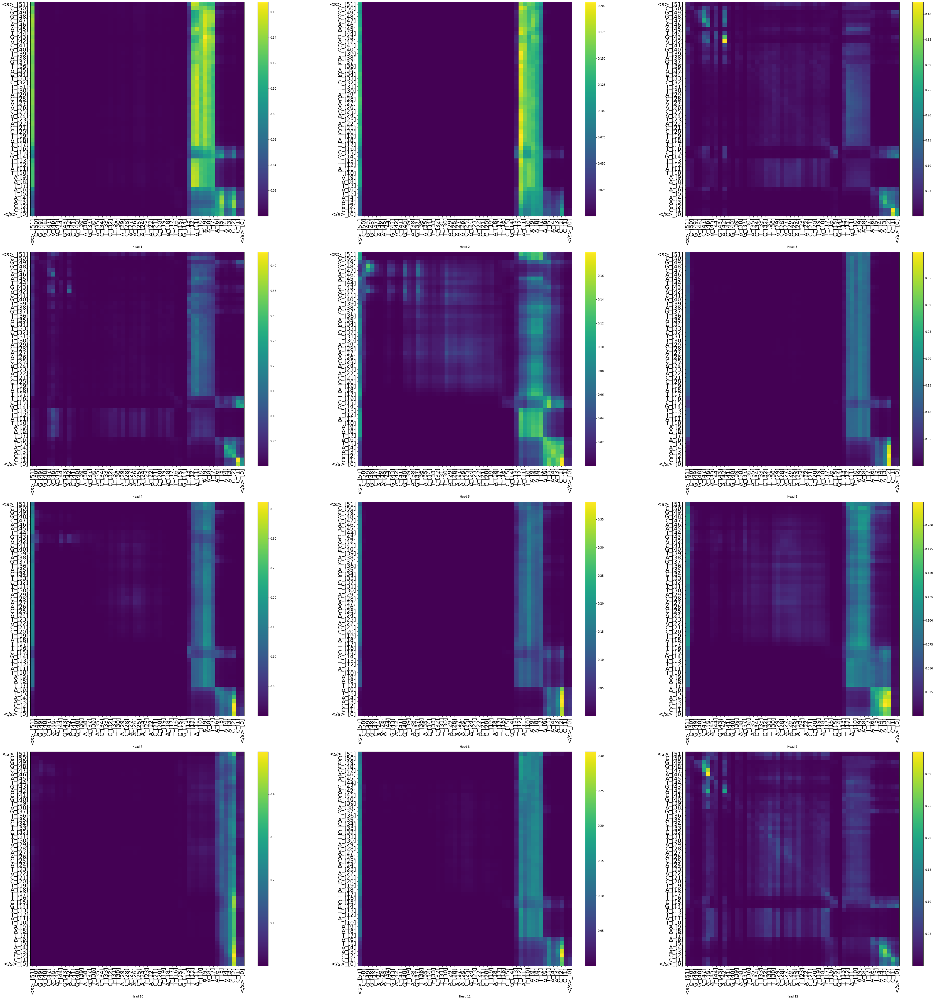

In [133]:
layer = 11
visualize_token2token_scores(output_attentions_all[layer].squeeze().detach().cpu().numpy())

In [134]:
if torch.__version__ >= '1.7.0':
    norm_fn = torch.linalg.norm
else:
    norm_fn = torch.norm

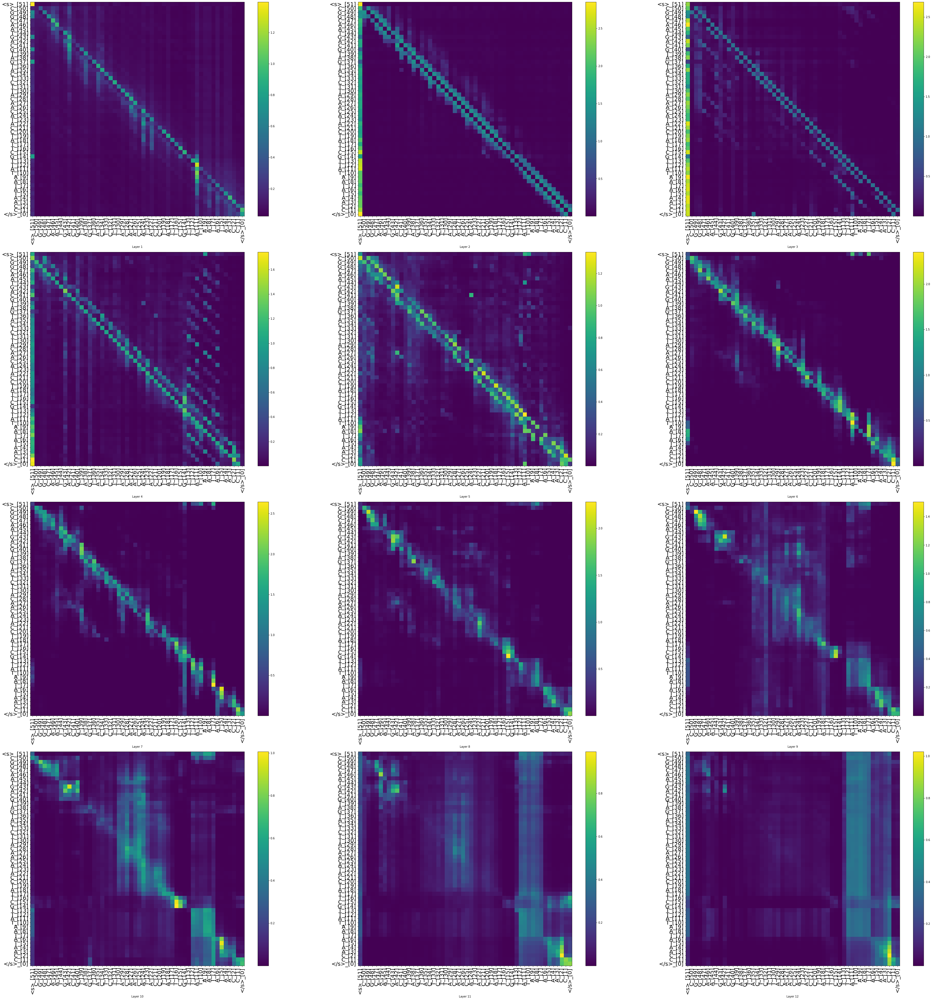

In [135]:
visualize_token2token_scores(norm_fn(output_attentions_all, dim=2).squeeze().detach().cpu().numpy(),
                             x_label_name='Layer')

In [107]:
df_pcc6803 = pd.read_csv('6803_exp_50_filtered.csv', header=0)
df_pcc6803['seq2']=df_pcc6803['sequence']
df_pcc6803['promoter']=1
df_pcc6803['non_promoter']=0
df_pcc6803

,sequence,read_tss,read_count,change_factor,ribosomal,seq2,promoter,non_promoter
0,TATTTGGCTAACTTAGATAATTTGGAGGTGGTGAAATTATTATCGG...,226,76.0,3.454545,no,TATTTGGCTAACTTAGATAATTTGGAGGTGGTGAAATTATTATCGG...,1,0
1,GCGCCCCGGGATGTGTGTGATCATCTTTACGAATATGGTAAACATT...,424,92.0,3.285714,no,GCGCCCCGGGATGTGTGTGATCATCTTTACGAATATGGTAAACATT...,1,0
2,CCAGCCCTATTTGCCATGGAAAAATATCCCCTACTTGGTAAATTAA...,577,293.0,8.371429,no,CCAGCCCTATTTGCCATGGAAAAATATCCCCTACTTGGTAAATTAA...,1,0
3,TTACCGATAATTCTGCCCATCCCCGGCCGACGTTGAAGGATTATAT...,919,59.0,3.250000,no,TTACCGATAATTCTGCCCATCCCCGGCCGACGTTGAAGGATTATAT...,1,0
4,CGTTATCGAGCCTCCATTCCCACCAGTTGGTTAAGCATTACCCTAA...,1233,12.0,6.000000,no,CGTTATCGAGCCTCCATTCCCACCAGTTGGTTAAGCATTACCCTAA...,1,0
...,...,...,...,...,...,...,...,...
13923,TGACGGTTACCCCAACTTTCAAGATTGAACCCAACTGCTACCATGG...,3532431,1648.0,73.428571,no,TGACGGTTACCCCAACTTTCAAGATTGAACCCAACTGCTACCATGG...,1,0
13924,ATTGTAACAAAGGTTCTGGGAATAATCCCGTTGCTGTTTATGATAA...,3546646,2001.0,400.200000,no,ATTGTAACAAAGGTTCTGGGAATAATCCCGTTGCTGTTTATGATAA...,1,0
13925,AATAAGACTCCACTATTGCAACTGCTGAGCCAAGGGACTATGATGG...,3552989,1509.0,137.181818,no,AATAAGACTCCACTATTGCAACTGCTGAGCCAAGGGACTATGATGG...,1,0
13926,CATCAATGGTGAACCCTCCTGGGTTTCGGTGTATCCGGTAAACTCT...,3558455,757.0,189.250000,no,CATCAATGGTGAACCCTCCTGGGTTTCGGTGTATCCGGTAAACTCT...,1,0


In [108]:
quant=df_pcc6803.read_count.quantile(q=0.5)
df_pcc6803=df_pcc6803[df_pcc6803["read_count"]>quant].reset_index(drop=True)
df_pcc6803

,sequence,read_tss,read_count,change_factor,ribosomal,seq2,promoter,non_promoter
0,TATTTGGCTAACTTAGATAATTTGGAGGTGGTGAAATTATTATCGG...,226,76.0,3.454545,no,TATTTGGCTAACTTAGATAATTTGGAGGTGGTGAAATTATTATCGG...,1,0
1,GCGCCCCGGGATGTGTGTGATCATCTTTACGAATATGGTAAACATT...,424,92.0,3.285714,no,GCGCCCCGGGATGTGTGTGATCATCTTTACGAATATGGTAAACATT...,1,0
2,CCAGCCCTATTTGCCATGGAAAAATATCCCCTACTTGGTAAATTAA...,577,293.0,8.371429,no,CCAGCCCTATTTGCCATGGAAAAATATCCCCTACTTGGTAAATTAA...,1,0
3,TTACCGATAATTCTGCCCATCCCCGGCCGACGTTGAAGGATTATAT...,919,59.0,3.250000,no,TTACCGATAATTCTGCCCATCCCCGGCCGACGTTGAAGGATTATAT...,1,0
4,ACCTTGGAACAGGCAGGATTTGCCCAAAAGAATTTGACTATCATTG...,1684,80.0,16.000000,no,ACCTTGGAACAGGCAGGATTTGCCCAAAAGAATTTGACTATCATTG...,1,0
...,...,...,...,...,...,...,...,...
6911,TGACGGTTACCCCAACTTTCAAGATTGAACCCAACTGCTACCATGG...,3532431,1648.0,73.428571,no,TGACGGTTACCCCAACTTTCAAGATTGAACCCAACTGCTACCATGG...,1,0
6912,ATTGTAACAAAGGTTCTGGGAATAATCCCGTTGCTGTTTATGATAA...,3546646,2001.0,400.200000,no,ATTGTAACAAAGGTTCTGGGAATAATCCCGTTGCTGTTTATGATAA...,1,0
6913,AATAAGACTCCACTATTGCAACTGCTGAGCCAAGGGACTATGATGG...,3552989,1509.0,137.181818,no,AATAAGACTCCACTATTGCAACTGCTGAGCCAAGGGACTATGATGG...,1,0
6914,CATCAATGGTGAACCCTCCTGGGTTTCGGTGTATCCGGTAAACTCT...,3558455,757.0,189.250000,no,CATCAATGGTGAACCCTCCTGGGTTTCGGTGTATCCGGTAAACTCT...,1,0


In [109]:
torch.cuda.empty_cache()

In [110]:
sum_predictions = []
sum_labels = []
for i in tqdm(range(0,len(df_pcc6803)-1,200)):
    test_df=df_pcc6803[i:i+200]
    
    pcc6803_dataset = PromoterDataset(
      test_df,
      tokenizer,
      max_token_len=maxlength
    )
    predictions = []
    labels = []
    THRESHOLD = 0.5
    for item in tqdm(pcc6803_dataset):
      _, prediction = trained_model(
        item["input_ids"].unsqueeze(dim=0).to(device), 
        item["attention_mask"].unsqueeze(dim=0).to(device),
        item["token_type_ids"].unsqueeze(dim=0).to(device)
      )
      sum_predictions.append(prediction.flatten().detach().cpu().numpy())
      sum_labels.append(item["labels"].int().detach().cpu().numpy())

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/116 [00:00<?, ?it/s]

In [111]:
y_pred = np.array(sum_predictions)
y_true = np.array(sum_labels)

upper, lower = 1, 0
y_pred = np.where(y_pred > THRESHOLD, upper, lower)

print(classification_report(
      y_true, 
      y_pred, 
      target_names=LABEL_COLUMNS, 
      zero_division=0
    ))

              precision    recall  f1-score   support

    promoter       1.00      0.87      0.93      6916
non_promoter       0.00      0.00      0.00         0

   micro avg       0.87      0.87      0.87      6916
   macro avg       0.50      0.44      0.47      6916
weighted avg       1.00      0.87      0.93      6916
 samples avg       0.87      0.87      0.87      6916

